**Objective :**
    
Program ini dibuat untuk melakukan prediksi suatu gambar kedalam suatu klasifikasi menggunakan CNN. Dataset gambar yang digunakan adalah ekspresi wajah dengan jumlah 6 klasifikasi ekspresi wajah. Dataset ini akan diuji menggunakan base model, model improvement berdasarkan insight evaluasi base model, dan model dengan transfer learning. 

---


**Problem Statement :**  
 
Membangun model berbasis deep learning yang dapat mengidentifikasi ekspresi wajah ke dalam beberapa kategori. Dengan adanya sistem otomatis ini, organisasi dapat menganalisis ekspresi pengguna atau audiens secara real-time untuk memahami respons emosional mereka terhadap konten, produk, atau lingkungan tertentu. 

---

# Import Libraries   


In [ ]:
# Import Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# path manipulation
import os
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

import python_splitter
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.applications.vgg16 import VGG16, preprocess_input


from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
# ignore warning
import warnings
warnings.filterwarnings('ignore')

# Check TensorFlow version
print(tf.__version__)

2.18.0


# Data Loading

Bagian ini mencakup informasi mengenai sumber dataset, proses impor dataset, serta deskripsi jumlah dataset di setiap kelas.

## Source Dataset

**Dataset**
Source: [Click Here!](https://www.kaggle.com/datasets/ritesh1420/face-expression-data)

In [ ]:
# Load dataset
path = r'C:\Users\asus\Documents\iyan nitip\Hacktiv\Phase 2\Grade Chalenge\p2-ftds021-hck-gc7-mseptianz\dataset 3'

Pada bagian ini sebelumnya telah dilakukan pemilihan gambar pada masing-masing folder, dari total keseluruhan gambar yang tersedia pada link di atas, dipilih 1000 gambar untuk setiap kelas.

In [3]:
def check_path(path):
  '''
  Fungsi ini dibuat untuk menampilkan jumlah data yang ada di dalam dataset training dan testing
  '''
  labels = os.listdir(path)
  for label in labels:
    if os.path.isdir(os.path.join(path, label)):
      num_data = len(os.listdir(os.path.join(path, label)))
      print(f'Total Data - {label} : {num_data}')

# menampilkan jumlah dataset training
print('Dataset')
check_path(path)
print('')


Dataset
Total Data - Ahegao : 1000
Total Data - angry : 1000
Total Data - Happy : 1000
Total Data - Neutral : 1000
Total Data - Sad : 1000
Total Data - Surprise : 1000



Dari hasil cek diatas diketahui data gambar yang dimiliki ada sebanyak 6000 gambar, berikutnya akan dilakukan splitting untuk data train,val dan test

## Split Train,Val and Test

Untuk melakukan split dari total data yang dimiliki, akan digunakan `python splitter` untuk mempermudah melakukan split data. 

In [ ]:
python_splitter.split_from_folder(r'C:\Users\asus\Documents\iyan nitip\Hacktiv\Phase 2\Grade Chalenge\p2-ftds021-hck-gc7-mseptianz\dataset 3', train = 0.5, test = 0.3, val = 0.2)

Setelah melakukan split, kita akan memasukan setiap folder pada sebuah variabel

## Import Dataset

In [22]:
train_path = r'C:\Users\asus\Documents\iyan nitip\Hacktiv\Phase 2\Grade Chalenge\p2-ftds021-hck-gc7-mseptianz\Train_Test_Folder\train'
test_path = r'C:\Users\asus\Documents\iyan nitip\Hacktiv\Phase 2\Grade Chalenge\p2-ftds021-hck-gc7-mseptianz\Train_Test_Folder\test'
val_path = r'C:\Users\asus\Documents\iyan nitip\Hacktiv\Phase 2\Grade Chalenge\p2-ftds021-hck-gc7-mseptianz\Train_Test_Folder\val'

## Jumlah Dataset Train,Val & Testing

In [ ]:
# Menampilkan jumlah dataset training
print('Training Dataset')
check_path(train_path)
print("===========================")
print('')
# Menampilkan jumlah dataset validation
print('Val Dataset')
check_path(val_path)
print('')
print("===========================")
# Menampilkan jumlah dataset test
print('Test Dataset')
check_path(test_path)
print("===========================")
print('')


Training Dataset
Total Data - Ahegao : 500
Total Data - angry : 500
Total Data - Happy : 500
Total Data - Neutral : 500
Total Data - Sad : 500
Total Data - Surprise : 500

Val Dataset
Total Data - Ahegao : 300
Total Data - angry : 300
Total Data - Happy : 300
Total Data - Neutral : 300
Total Data - Sad : 300
Total Data - Surprise : 300

Test Dataset
Total Data - Ahegao : 200
Total Data - angry : 200
Total Data - Happy : 200
Total Data - Neutral : 200
Total Data - Sad : 200
Total Data - Surprise : 200



**Noted :**
- Dataset train adalah dataset yang digunakan untuk melatih model kita. 
- Dataset Val digunakan untuk menilai kinerja model selama proses pelatihan. Kita bisa menggunakan dataset ini untuk melihat apakah model kita mulai overfitting (terlalu menghafal data train) atau underfitting (tidak cukup belajar).
- Dataset Test digunakan untuk mengukur kinerja akhir model setelah pelatihan selesai.

Dari output diatas didapatkan informasi bahwa jumlah gambar per kategori terdistribusi seimbang,dengan distribusi seimbang seperti ini memiliki peluang besar untuk membangun model pengenalan emosi yang akurat

# Exploratory Data Analysis (EDA)

## Showing 5 images in each class 

In [30]:
def plot_images(path):
  '''
  Fungsi ini dibuat untuk menampilkan gambar yang ada didalam dataset training dan testing per masing-masing class
  '''
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    if os.path.isdir(folder_path):
      fig = plt.figure(figsize=(20, 20))
      columns = 5
      rows = 1
      print('Class : ', label)
      images = os.listdir(folder_path)
      for index in range(1, columns*rows +1):
          fig.add_subplot(rows, columns, index)
          image = plt.imread(os.path.join(folder_path, images[index]))
          plt.imshow(image)
          plt.axis("off")
      plt.show()

Class :  Ahegao


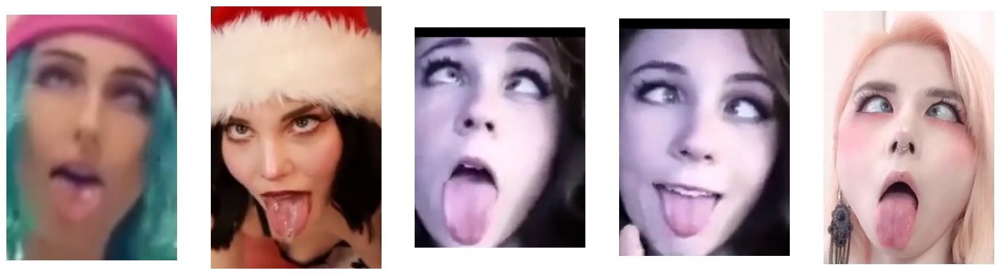

Class :  angry


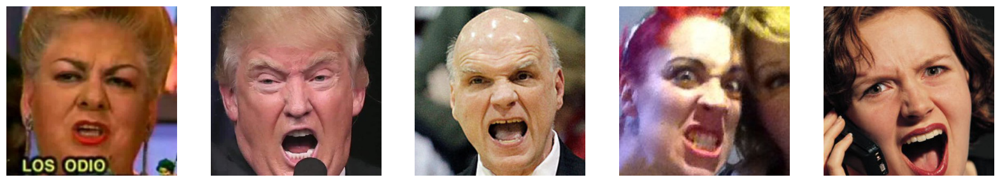

Class :  Happy


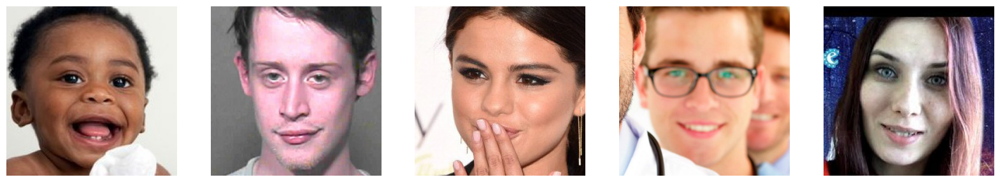

Class :  Neutral


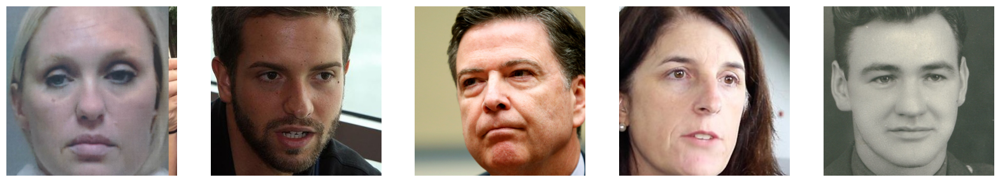

Class :  Sad


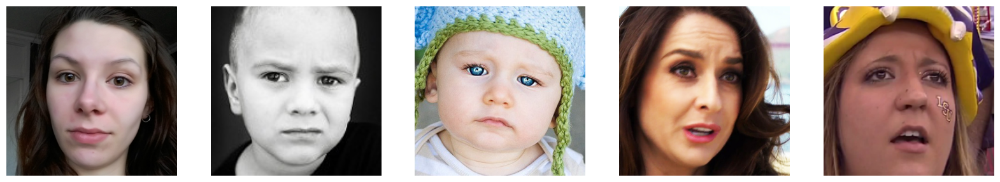

Class :  Surprise


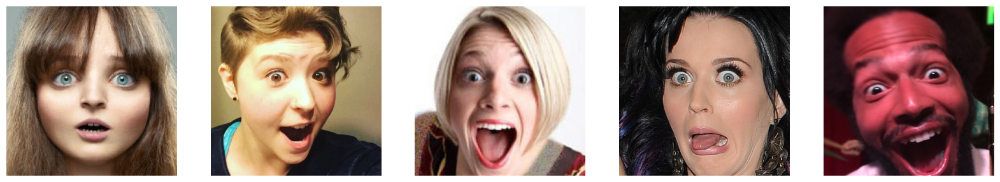

In [ ]:
# Menampilkan gambar dataset training
plot_images(train_path)

Class :  Ahegao


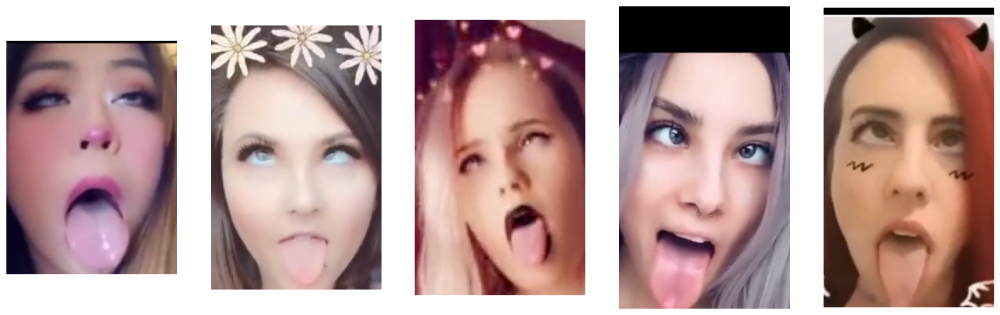

Class :  angry


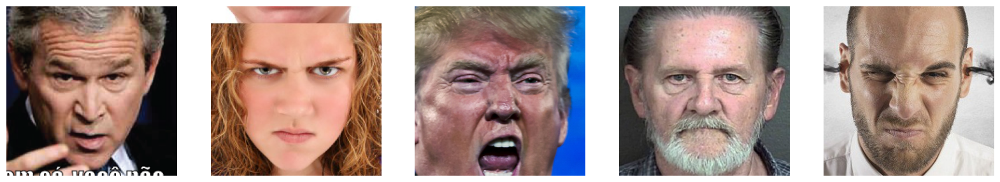

Class :  Happy


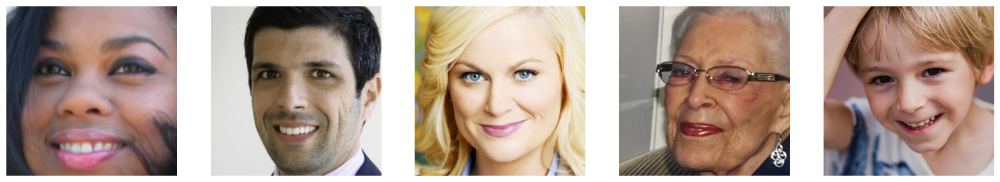

Class :  Neutral


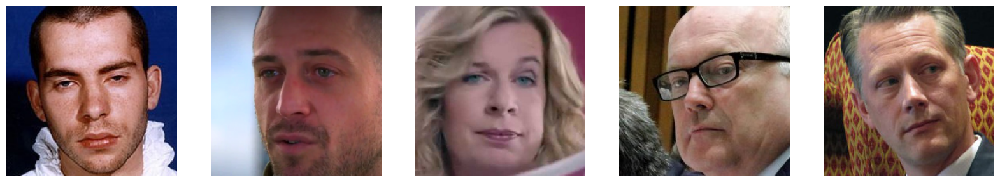

Class :  Sad


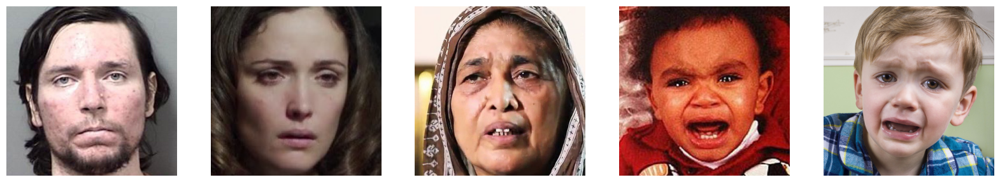

Class :  Surprise


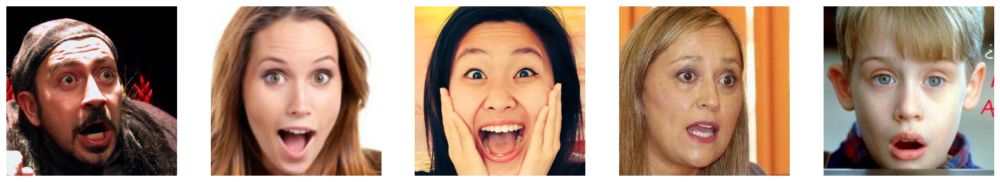

In [ ]:
# Menampilkan gambar dataset test
plot_images(test_path)

## Class Distribution

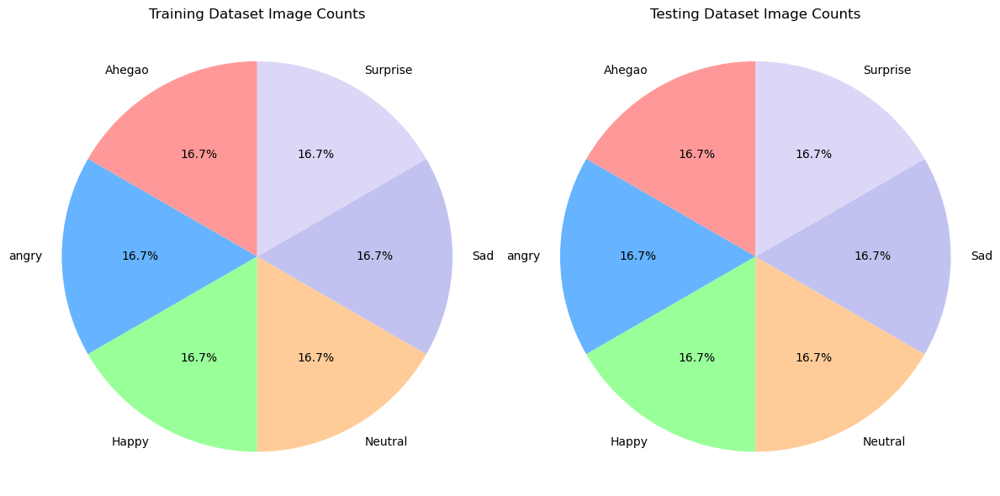

In [10]:
def group_and_count_images(path):
    '''
    Fungsi ini dibuat untuk melakukan grouping dan menjumlahkan data per class yang ada pada dataset training dan testing
    '''
    category_counts = {}
    # looping data per kategori di dalam folder utama
    for category in os.listdir(path):
        category_path = os.path.join(path, category)

        # cek per kategori
        if os.path.isdir(category_path):
            # listing file gambar 
            image_files = os.listdir(category_path)

            # menjumlahkan total gambar
            category_counts[category] = len(image_files)

    return category_counts

# menyimpan jumlah data gambar di dataset training
train_image_counts = group_and_count_images(train_path)

# menyimpan jumlah data gambar di dataset testing
test_image_counts = group_and_count_images(test_path)

# mendefinisikan warna per kategori
colors = {
    'Ahegao': '#ff9999',  
    'angry': '#66b3ff',   
    'Happy': '#99ff99',  
    'Neutral': '#ffcc99',   
    'Sad': '#c2c2f0',    
    'Surprise': '#dcd6f7'    
}

def plot_side_by_side_pie_charts(train_data, test_data):
    '''
    Fungsi ini digunakan untuk membuat pie chart komposisi data per kategori yang ada dalam dataset training dan testing
    '''
    # labeling kategori dataset training
    labels_train = list(train_data.keys())

    # listing jumlah gambar per kategori di dataset training
    sizes_train = list(train_data.values())
    
    # labeling kategori dataset testing
    labels_test = list(test_data.keys())

    # listing jumlah gambar per kategori di dataset testing
    sizes_test = list(test_data.values())  

    # menyesuaikan warna per kategori
    train_colors = [colors[label] for label in labels_train]
    test_colors = [colors[label] for label in labels_test]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Pie chart dataset training
    ax1.pie(sizes_train, labels=labels_train, colors=train_colors, autopct='%1.1f%%', startangle=90)
    ax1.set_title('Training Dataset Image Counts')
    ax1.axis('equal')

    # Pie chart dataset testing
    ax2.pie(sizes_test, labels=labels_test, colors=test_colors, autopct='%1.1f%%', startangle=90)
    ax2.set_title('Testing Dataset Image Counts')
    ax2.axis('equal')

    # menampilkan chart
    plt.tight_layout()
    plt.show()

# menampilkan pie chart proporsi data per kategori di dataset training dan testing
plot_side_by_side_pie_charts(train_image_counts, test_image_counts)


# Feature Engineering CNN Base Model
---

## Prepocessing

In [ ]:
# Menentukan ukuran image dan batch size
img_height = 224
img_width = 224
batch_size = 32


In [ ]:

# preprocessing gambar
train_datagen = ImageDataGenerator(rescale=1./255.)

# define train set
train_set = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height, img_width),
                                              class_mode='sparse',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=10)

val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)
# define validation set
val_set = val_datagen.flow_from_directory(val_path,
                                          target_size=(img_height, img_width),
                                          class_mode='sparse',
                                          batch_size=batch_size,
                                          shuffle=True,
                                          seed=10)

# preprocessing gambar
test_datagen =tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

# define test set
test_set = test_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=10)

Found 3000 images belonging to 6 classes.
Found 1800 images belonging to 6 classes.
Found 1200 images belonging to 6 classes.


- **Ukuran gambar dan ukuran batch** 

    Gambar diubah menjadi ukuran 224 x 224 piksel dengan ukuran batch 32. Untuk model berbasis deep learning, seperti CNN, ukuran gambar dan batch ini digunakan untuk menjaga ukuran memori yang efisien tanpa mengurangi detail visual.

- **Preposessing gambar**  

    Dengan menggunakan parameter rescale=1./255, gambar akan di-rescale ke dalam rentang nilai antara 0 dan 1 (sebelumnya 0 hingga 255). Ini membantu model konvergen lebih cepat karena jaringan saraf biasanya bekerja lebih baik dengan input skala kecil.

- **Train set, validation set, dan test set**  
 
    Ukuran gambar disesuaikan dengan target size (224x224). Parameter shuffle=True diterapkan untuk memastikan gambar diacak setiap epoch, yang membantu model mempelajari fitur dari data tanpa mengikuti urutan tertentu. Untuk test set, prosesnya hampir sama, hanya saja parameter shuffle diatur menjadi False. Label untuk masing-masing dataset dikategorikan menggunakan metode sparse, di mana label dikodekan sebagai bilangan bulat.

In [4]:
# membuat variabel untuk menampung key dan value kelas dataset train
trac = train_set.class_indices

# membuat variabel untuk menampung key dan value kelas dataset validation
valc = val_set.class_indices

# membuat variabel untuk menampung key dan value kelas dataset test
tesc = test_set.class_indices

#menampilkan class dataset train
print(f'Class pada train set:\n{trac}\n')

#menampilkan class dataset validation
print(f'Class pada validation set:\n{valc}\n')

#menampilkan class dataset test
print(f'Class pada test set:\n{tesc}')

Class pada train set:
{'Ahegao': 0, 'Happy': 1, 'Neutral': 2, 'Sad': 3, 'Surprise': 4, 'angry': 5}

Class pada validation set:
{'Ahegao': 0, 'Happy': 1, 'Neutral': 2, 'Sad': 3, 'Surprise': 4, 'angry': 5}

Class pada test set:
{'Ahegao': 0, 'Happy': 1, 'Neutral': 2, 'Sad': 3, 'Surprise': 4, 'angry': 5}


Dari hasil output diatas diketahui bahwa setiap set memiliki banyak class yang sama yaitu terdiri dari 5 class 

## Base Model Definition with sequential API

In [5]:
# Clear session untuk menghapus model sebelumnya
tf.keras.backend.clear_session()
seed = 20
np.random.seed(seed)
tf.random.set_seed(seed)

# Definisikan ulang model dari awal (kode definisi model yang sama seperti sebelumnya)
model = Sequential() 
model.add(Conv2D(32, (3, 3), padding='same', strides=(2,2), activation='relu', input_shape=(img_height, img_width,3)))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.1, seed=seed))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((3, 3)))
model.add(Dropout(0.1, seed=seed))
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.1, seed=seed))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(6, activation='softmax'))

# Compile ulang model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

c:\Users\asus\Anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 112, 112, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 54, 54, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 10368)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 10368)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     5,308,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,405,254 (20.62 MB)

 Trainable params: 5,405,254 (20.62 MB)

 Non-trainable params: 0 (0.00 B)

- Inisialisasi dan Seed:

    - tf.keras.backend.clear_session() digunakan untuk membersihkan sesi sebelumnya, menghapus model yang sudah ada dari memori, dan memastikan bahwa tidak ada model yang masih aktif.
    - Seed diatur untuk memastikan hasil yang konsisten dengan np.random.seed(seed) dan tf.random.set_seed(seed), sehingga setiap kali kode dijalankan, hasilnya akan sama.

- Definisi Model:

    - Layer pertama adalah layer konvolusi dengan 32 filter berukuran 3x3, padding 'same' untuk menjaga ukuran frame tetap, strides (2,2) untuk mengurangi resolusi secara bertahap, dan fungsi aktivasi ReLU. Layer ini menerima input gambar dengan ukuran (img_height, img_width, 3).
    - Setelah layer konvolusi pertama, terdapat MaxPooling2D dengan ukuran (2,2) untuk mengurangi dimensi fitur, diikuti oleh Dropout dengan rate 0.1 untuk mencegah overfitting. Seed diatur untuk memastikan konsistensi selama pelatihan.
    - Layer kedua adalah konvolusi dengan 64 filter berukuran 3x3 dan fungsi aktivasi ReLU. Layer ini juga diikuti oleh MaxPooling2D dengan ukuran (3,3) dan Dropout dengan rate 0.1.
    - Layer ketiga adalah konvolusi dengan 128 filter berukuran 3x3, padding 'same', dan fungsi aktivasi ReLU, diikuti oleh MaxPooling2D dengan ukuran (2,2) dan Dropout dengan rate 0.1.

- Flatten dan Fully Connected Layer:

    - Layer Flatten digunakan untuk mengubah output tiga dimensi menjadi vektor satu dimensi sebelum diteruskan ke layer fully connected.
   -  Dropout dengan rate 0.5 diterapkan pada layer ini untuk mencegah overfitting.
    - Layer Dense pertama memiliki 512 unit dengan fungsi aktivasi ReLU.
    - Layer Dense terakhir memiliki 6 unit dengan fungsi aktivasi softmax, yang menghasilkan probabilitas untuk setiap dari 6 kelas yang ditargetkan.

- Model compile :    
    - Model dikompilasi menggunakan optimizer Adam, dengan loss function sparse_categorical_crossentropy untuk klasifikasi multi-kelas dengan label integer, dan metrik akurasi sebagai evaluasi performa model.

## Base Model Architecture

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model, show_shapes=True)

## Base Model Train

In [ ]:
# training model
history = model.fit(train_set,
                    validation_data=val_set,
                    epochs=20,
                    batch_size=batch_size
                   )

Epoch 1/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 40s 404ms/step - accuracy: 0.2050 - loss: 1.8304 - val_accuracy: 0.3889 - val_loss: 1.4525
Epoch 2/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 34s 359ms/step - accuracy: 0.4288 - loss: 1.3788 - val_accuracy: 0.5061 - val_loss: 1.2398
Epoch 3/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 34s 360ms/step - accuracy: 0.5107 - loss: 1.2113 - val_accuracy: 0.5239 - val_loss: 1.1749
Epoch 4/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 34s 359ms/step - accuracy: 0.5559 - loss: 1.0669 - val_accuracy: 0.5883 - val_loss: 1.0598
Epoch 5/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 34s 356ms/step - accuracy: 0.6151 - loss: 0.9721 - val_accuracy: 0.5883 - val_loss: 1.0054
Epoch 6/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 34s 357ms/step - accuracy: 0.6574 - loss: 0.8944 - val_accuracy: 0.6217 - val_loss: 0.9801
Epoch 7/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 34s 357ms/step - accuracy: 0.6759 - loss: 0.8205 - val_accuracy: 0.6144 - val_loss: 0.9702
Epoch 8/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 33s 354ms/step - accuracy: 0.6874 - loss: 0.7683 - val_accu

Setelah training model dengan menjalankan 20 epoch, didapatkan insight dan rekomendasi berikut:

Insight:
- Nilai loss pada train menurun secara drastis baik akan tetapi pada validation nilai loss mengalami penurunan sampai ke epoch -8 dan  mengalami penaikan kembali di epoch berikutnya
- Pada epoch 1 hingga 5, terlihat bahwa nilai loss dan accuracy masih stabil. Namun, setelah epoch 12, loss mulai meningkat tajam, dan di epoch-epoch selanjutnya, loss semakin memburuk hingga mencapai nilai yang sangat besar
- Pada data train & Val nilai accuracy meningkat secara bertahap di masing-masing epoch, namun selisih kenaikan nilai akurasi antara train & val sangat jauh berbeda menandakan adanya indikasi model overfitting

 **Noted** :
      
     Telah dilakukan percobaan trial & error dengan menambah layer dan mengurangi layer, hasil diatas merupakan prediksi terbaik yang ditemukan


## Model Architecture

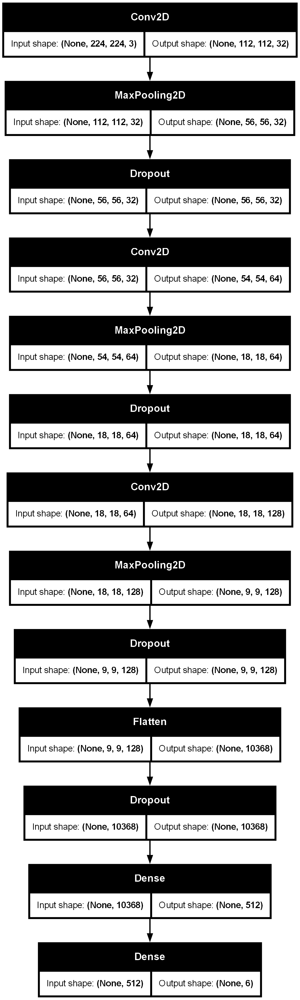

In [6]:
# Plot layers

tf.keras.utils.plot_model(model, show_shapes=True)

## Base Model Evaluation

### Base Model Loss & Accuracy Plot 

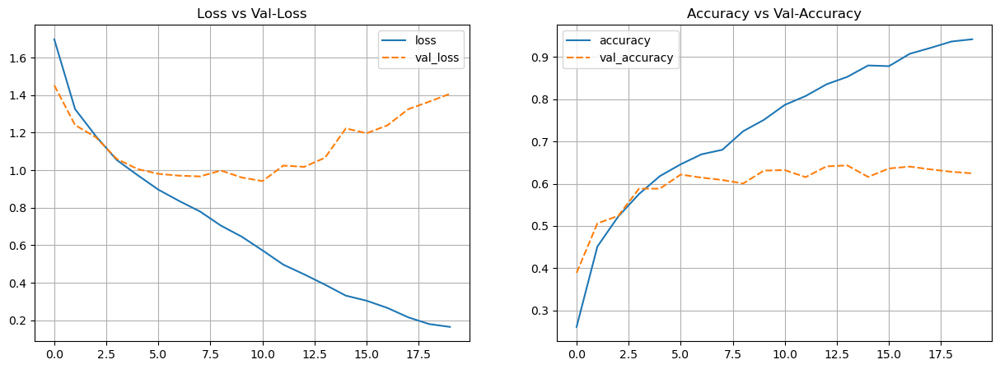

In [32]:
# Plot training results
history_df = pd.DataFrame(history.history)

# plotting loss vs val_loss
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

# plotting accuracy vs val_accuracy
plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

# menampilkan plot
plt.show()

- Terdapat gap yang cukup signifikan antara loss dan val_loss, Ini mengindikasikan adanya overfitting, di mana model terlalu menghafal data train sehingga performanya menurun pada data validasi.
- Akurasi baik pada data train maupun validasi terus meningkat seiring bertambahnya epoch, yang menunjukkan bahwa model semakin baik dalam mengklasifikasikan data.
-  Meskipun akurasi meningkat, gap antara accuracy dan val_accuracy juga semakin lebar, yang kembali menunjukkan adanya overfitting.

### Base Model Classification Report Evaluation

In [34]:
# predict test set
y_pred_prob = model.predict(test_set)

# mengklasifikasikan class berdasarkan nilai proba terbesar
y_pred_class = np.argmax(y_pred_prob, axis=-1)

# menampilkan classification report
print(classification_report(test_set.classes, y_pred_class, target_names=np.array(list(train_set.class_indices.keys()))))

c:\Users\asus\Anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step
              precision    recall  f1-score   support

      Ahegao       0.83      0.76      0.79       200
       Happy       0.59      0.68      0.63       200
     Neutral       0.45      0.40      0.42       200
         Sad       0.42      0.52      0.47       200
    Surprise       0.71      0.69      0.70       200
       angry       0.70      0.58      0.64       200

    accuracy                           0.61      1200
   macro avg       0.62      0.61      0.61      1200
weighted avg       0.62      0.61      0.61      1200



Dari Classification report di atas diketahui : 
- Ahegao dan Surprise: Memiliki kinerja yang cukup baik, dengan nilai precision dan recall yang relatif tinggi. Model cukup handal dalam mengklasifikasikan kedua emosi ini.
- Happy dan Angry: Kinerja model untuk kedua kelas ini cukup baik, tetapi masih ada ruang untuk perbaikan, terutama pada precision.
- Neutral dan Sad: Kinerja model untuk kedua kelas ini kurang memuaskan, dengan nilai precision dan recall yang rendah. Ini mengindikasikan bahwa model sering salah mengklasifikasikan contoh dari kelas neutral dan sad sebagai kelas lain.
-  Akurasi keseluruhan model adalah 61%. Ini berarti model dapat mengklasifikasikan 61% dari data uji dengan benar. 

Noted : 
- **Precision:**   
    Proporsi prediksi positif yang benar. Semakin tinggi precision, semakin sedikit false positive (klasifikasi salah sebagai kelas positif).
- **Recall:**    
    Proporsi contoh positif yang benar-benar diklasifikasikan sebagai positif. Semakin tinggi recall, semakin sedikit false negative (contoh positif yang diklasifikasikan sebagai negatif).
- **F1-score:**    
    Harmonic mean dari precision dan recall. Ini memberikan keseimbangan antara precision dan recall.
- **Support:**    
    Jumlah contoh aktual dari setiap kelas dalam data uji.

### Base Model Confusion Matrix Evaluation

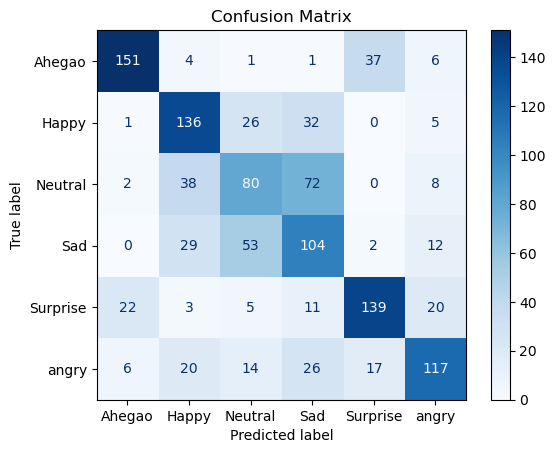

In [ ]:
# mendapatkan label asli dari dataset test
y_true_labels = test_set.classes

# membuat confusion matrix
cm = confusion_matrix(y_true_labels, y_pred_class)

# menampilkan confusion matrix dalam bentuk plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set.class_indices.keys())
disp.plot(cmap=plt.cm.Blues)

# menampilkan plot
plt.title('Confusion Matrix')
plt.show()

Dari Hasil visualisasi confusion matriks diatass diketahui : 

- Model paling faham ketika memprediksi ekspresi `ahegao`, dari total keseluruhan ekspresi
- Model memiliki kinerja yang cukup baik dalam mengklasifikasikan emosi `Ahegao` dan `Surprise`. Namun, model masih kesulitan dalam membedakan antara kelas `Neutral` dan `Sad`.
- Kesalahan klasifikasi paling sering terjadi antara kelas-kelas yang memiliki kemiripan ekspresi wajah, seperti `Neutral` dan `Sad`.
- Model paling sulit ketika memprediksi ekspresi `neutral` dikarenakan sering kali ketika memprediksi gambar `neutral` diprediksi sebagai `sad`
- Model paling sulit ketika memprediksi ekspresi `sad` dikarenakan sering kali ketika memprediksi gambar `sad` diprediksi sebagai `neutral`
- Model sudah cukup baik ketika memprediksi ekspresi `angry` dan `happy`

**Conclusion :**

    Model klasifikasi emosi saat ini masih mengalami kesulitan dalam membedakan beberapa kelas. Untuk mengatasi masalah ini, selanjutnya akan dilakukan augmentasi data dengan fokus pada variasi ekspresi wajah yang membedakan kelas tersebut

# Feature Engineering CNN Model Improvement
---

## Prepocessing

In [ ]:
# menentukan ukuran image dan batch size
img_height = 224
img_width = 224
batch_size = 32

In [ ]:
# preprocessing gambar
train_datagen = ImageDataGenerator(rescale=1./255.,
                                   rotation_range=20,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   fill_mode='nearest')

# define train set
train_set_improvement = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height, img_width),
                                              class_mode='sparse',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=10)

val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                   rotation_range=20,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
# define validation set
val_set_improvement = val_datagen.flow_from_directory(val_path,
                                          target_size=(img_height, img_width),
                                          class_mode='sparse',
                                          batch_size=batch_size,
                                          shuffle=True,
                                          seed=10)

# preprocessing gambar
test_datagen =tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

# define test set
test_set_improvement = test_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=10)

Found 3000 images belonging to 6 classes.
Found 1800 images belonging to 6 classes.
Found 1200 images belonging to 6 classes.


## Model Improvement Definition

In [16]:
# Clear session
seed = 10
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# define model
model_imp = Sequential()

# add layer
model_imp.add(Conv2D(32, (3, 3), padding='same', strides=(2,2), kernel_regularizer=l2(0.05), activation='relu', input_shape=(img_height, img_width,3)))
model_imp.add(BatchNormalization())
model_imp.add(MaxPooling2D((2, 2)))
model_imp.add(Dropout(0.1, seed=seed))
model_imp.add(Conv2D(64, (3, 3), kernel_regularizer=l2(0.01), activation='relu'))
model_imp.add(BatchNormalization())
model_imp.add(MaxPooling2D((2, 2)))
model_imp.add(Dropout(0.2, seed=seed))
model_imp.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model_imp.add(BatchNormalization())
model_imp.add(MaxPooling2D((2, 2)))
model_imp.add(Dropout(0.2, seed=seed))
model_imp.add(Flatten())
model_imp.add(Dropout(0.5))
model_imp.add(Dense(512, activation='relu'))
model_imp.add(Dense(6, activation='softmax'))

# Compile model 
model_imp.compile(optimizer=Adam(learning_rate=0.00001),  # Mengurangi learning rate
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

# menampilkan summary architecture model
model_imp.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 112, 112, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 54, 54, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 54, 54, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 27, 27, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 27, 27, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 27, 27, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 27, 27, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 13, 13, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 13, 13, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 21632)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 21632)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    11,076,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,173,318 (42.62 MB)

 Trainable params: 11,172,870 (42.62 MB)

 Non-trainable params: 448 (1.75 KB)

## Model Improvement Training

In [17]:
# Train the model
history = model_imp.fit(
    train_set_improvement,
    validation_data=val_set_improvement,
    epochs=20, 
)

Epoch 1/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 194s 2s/step - accuracy: 0.2147 - loss: 4.1360 - val_accuracy: 0.1667 - val_loss: 2.6812
Epoch 2/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 192s 2s/step - accuracy: 0.2450 - loss: 3.6157 - val_accuracy: 0.1667 - val_loss: 2.9525
Epoch 3/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 195s 2s/step - accuracy: 0.2487 - loss: 3.4151 - val_accuracy: 0.1828 - val_loss: 2.9022
Epoch 4/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 181s 2s/step - accuracy: 0.2813 - loss: 3.2190 - val_accuracy: 0.2156 - val_loss: 2.8086
Epoch 5/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 181s 2s/step - accuracy: 0.2582 - loss: 3.0723 - val_accuracy: 0.2606 - val_loss: 2.6369
Epoch 6/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.2623 - loss: 2.9114 - val_accuracy: 0.2878 - val_loss: 2.4538
Epoch 7/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 183s 2s/step - accuracy: 0.2882 - loss: 2.7443 - val_accuracy: 0.3467 - val_loss: 2.3478
Epoch 8/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 179s 2s/step - accuracy: 0.2914 - loss: 2.6933 - val_accuracy: 0.3428 - v

In [ ]:
# membuat variabel untuk menampung key dan value kelas dataset train
trac_imp = train_set_improvement.class_indices

# membuat variabel untuk menampung key dan value kelas dataset validation
valc_imp = val_set_improvement.class_indices

# membuat variabel untuk menampung key dan value kelas dataset test
tesc_imp = test_set_improvement.class_indices

# menampilkan class dataset train
print(f'Class pada train set:\n{trac_imp}\n')

# menampilkan class dataset validation
print(f'Class pada validation set:\n{valc_imp}\n')

# menampilkan class dataset test
print(f'Class pada test set:\n{tesc_imp}\n')

Class pada train set:
{'Ahegao': 0, 'Happy': 1, 'Neutral': 2, 'Sad': 3, 'Surprise': 4, 'angry': 5}

Class pada validation set:
{'Ahegao': 0, 'Happy': 1, 'Neutral': 2, 'Sad': 3, 'Surprise': 4, 'angry': 5}

Class pada test set:
{'Ahegao': 0, 'Happy': 1, 'Neutral': 2, 'Sad': 3, 'Surprise': 4, 'angry': 5}



### Model Architecture

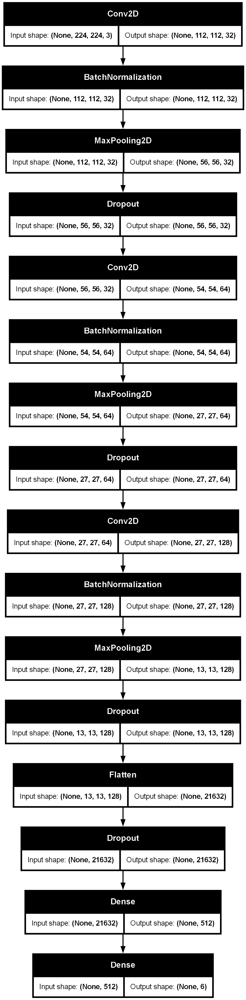

In [19]:
# menampilkan plot architecture model dengan data augmentation
tf.keras.utils.plot_model(model_imp, show_shapes=True)

## Model Improvement Evaluation

### Model Improvement Loss & Accuracy Plot

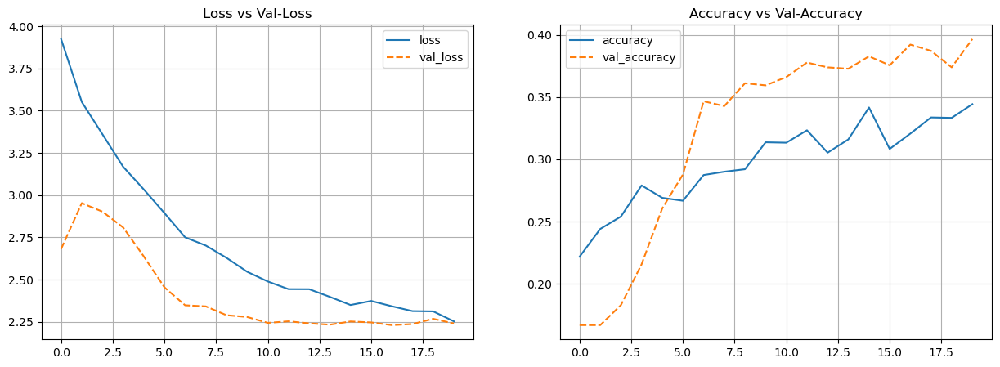

In [21]:
# Plot training results
history_df = pd.DataFrame(history.history)

# plotting loss vs val_loss
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

# plotting accuracy vs val_accuracy
plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

# menampilkan plot
plt.show()

Dari Graphic di atas diketahui : 
- Nilai loss (kesalahan) pada data training secara umum menurun seiring dengan meningkatnya jumlah epoch, Namun, nilai val_loss menunjukkan tren yang berbeda. di beberapa epoch awal, val_loss mengalami penurunan, tetapi kemudian mengalami peningkatansetelah beberapa epoch dan kembali turun lagi.
-  Kenaikan val_loss setelah titik tertentu mengindikasikan terjadinya overfitting. Artinya, model terlalu menghafal data pelatihan dan tidak mampu menggeneralisasi dengan baik pada data yang belum pernah dilihat sebelumnya.
- Nilai akurasi pada data training terus mengalami peningkatan seiring dengan meningkatnya jumlah epoch namun terdapat gap yang cukup signifikan dengan nilai val_accuracy, ini menunjukan adanya kemungkinan overfitting

**Conclusion :** 

    Model masih mengalami overfitting. Model telah mempelajari data pelatihan dengan sangat baik, tetapi tidak mampu menggeneralisasi dengan baik pada data yang baru.

### Model Improvement Classification Report Evaluation

In [22]:
# predict test set
y_pred_prob_imp = model_imp.predict(test_set_improvement)

# mengklasifikasikan class berdasarkan nilai proba terbesar
y_pred_class_imp = np.argmax(y_pred_prob_imp, axis=-1)

# menampilkan classification report
print(classification_report(test_set_improvement.classes, y_pred_class_imp, target_names=np.array(list(train_set_improvement.class_indices.keys()))))

c:\Users\asus\Anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 21s 534ms/step
              precision    recall  f1-score   support

      Ahegao       0.54      0.69      0.60       200
       Happy       0.42      0.32      0.36       200
     Neutral       0.36      0.23      0.28       200
         Sad       0.35      0.46      0.39       200
    Surprise       0.41      0.52      0.46       200
       angry       0.58      0.41      0.48       200

    accuracy                           0.44      1200
   macro avg       0.44      0.44      0.43      1200
weighted avg       0.44      0.44      0.43      1200



Dari hasil classification report diatas, diketahui :
- Model lebih banyak memprediksi class sebagai `ahegao` dengan nilai recall 0.69, nilai ini merupakan nilai yang tertinggi diantara kelas-kelas lain
- Akurasi keseluruhan hanya 0.44, yang menunjukkan model masih belum mampu belajar dengan baik sehingga kinerja model masih perlu ditingkatkan.
- Model paling kesulitan ketika memprediksi kelas `Neutral`

Noted : 
- **Precision:**   
    Proporsi prediksi positif yang benar. Semakin tinggi precision, semakin sedikit false positive (klasifikasi salah sebagai kelas positif).
- **Recall:**    
    Proporsi contoh positif yang benar-benar diklasifikasikan sebagai positif. Semakin tinggi recall, semakin sedikit false negative (contoh positif yang diklasifikasikan sebagai negatif).
- **F1-score:**    
    Harmonic mean dari precision dan recall. Ini memberikan keseimbangan antara precision dan recall.
- **Support:**    
    Jumlah contoh aktual dari setiap kelas dalam data uji.

### Model Improvement Confusion Matrix Evaluation

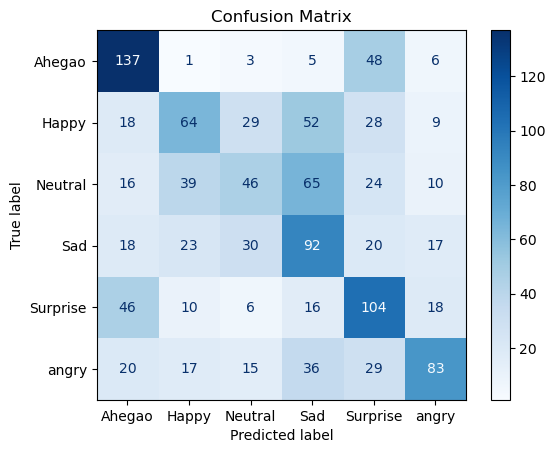

In [24]:
# mendapatkan label asli dari dataset test
y_true_labels = test_set_improvement.classes

# membuat confusion matrix
cm = confusion_matrix(y_true_labels, y_pred_class_imp)

# menampilkan confusion matrix dalam bentuk plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set_improvement.class_indices.keys())
disp.plot(cmap=plt.cm.Blues) 

# menampilkan plot
plt.title('Confusion Matrix')
plt.show()

Berdasarkan visualisasi confusion matrix diatas,diketahui :

- Model memiliki kemampuan terbaik untuk mengklasifikasikan ekspresi "Ahegao". 
- Model juga cukup baik dalam mengklasifikasikan ekspresi "Surprise"; namun, beberapa kali ekspresi ini salah diklasifikasikan sebagai ekspresi lain.
- Model seringkali salah mengklasifikasikan ekspresi "Neutral" sebagai "Sad" dan sebaliknya, karena model mengalami kesulitan membedakan ekspresi "Neutral" dan "Sad".
- Ekspresi "Neutral" dan "Sad" dapat dianggap sebagai kelas yang paling sulit untuk diperdiksi dalam model.
- Model mengklasifikasikan ekspresi "Angry" dan "Happy" dengan cukup baik, meskipun terdapat beberapa kesalahan klasifikasi, secara keseluruhan model mampu membedakan kedua ekspresi dengan cukup akurat.


**Conclusion**

    Setelah dilakukan percobaan model improvement dengan augmentasi data,model masih belum bisa belajar dengan baik dan masih menunjukan adanya overfitting , nilai akurasi yang didapat justru lebih rendah dari pada `base model`, namun dengan augmentasi data gap/jarak nilai antara akurasi data train dengan akurasi data val cukup mengecil. 

Selanjutnya akan dilakukan percobaan dengan memanfaatkan metode `Transfer Learning` untuk meningkatkan performa model 

# Feature Engineering CNN with Transfer Learning

## Preprocessing

In [ ]:
# Define hyperparameters

img_height= 224
img_width= 224

In [6]:
pretrained_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height,img_width, 3))
pretrained_model.trainable = False

In [25]:

train_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=20,
                                                                   zoom_range=0.05,
                                                                   width_shift_range=0.05,
                                                                   height_shift_range=0.05,
                                                                   shear_range=0.05,
                                                                   horizontal_flip=True,
                                                                   preprocessing_function=preprocess_input)
                                                        

val_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=20,
                                                                   zoom_range=0.05,
                                                                   width_shift_range=0.05,
                                                                   height_shift_range=0.05,
                                                                   shear_range=0.05,
                                                                   horizontal_flip=True,
                                                                   preprocessing_function=preprocess_input)
# define train set

train_set_tl = train_datagen_tl.flow_from_directory(train_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)
# Define Validation set
val_set_tl = val_datagen_tl.flow_from_directory(val_path,
                                                  target_size=(img_height,img_width),
                                                  class_mode='sparse',
                                                  batch_size=batch_size,
                                                  shuffle=True,
                                                  seed=2)
# Define test set
test_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

test_set_tl = test_datagen_tl.flow_from_directory(test_path,
                                                  target_size=(img_height,img_width),
                                                  class_mode='sparse',
                                                  batch_size=batch_size,
                                                  shuffle=False,
                                                  seed=2)

Found 3000 images belonging to 6 classes.
Found 1800 images belonging to 6 classes.
Found 1200 images belonging to 6 classes.


## Model Definition

In [14]:
# clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Load pretrained model (misalnya, VGG16) tanpa lapisan atas (fully connected layer)
pretrained_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
pretrained_model.trainable = False  # Freeze pretrained model

# Add custom layers on top of pretrained model
model_tl = Sequential()
model_tl.add(pretrained_model)
model_tl.add(Conv2D(32, (3, 3), padding='same', strides=(2,2), activation='relu'))
model_tl.add(BatchNormalization())
model_tl.add(MaxPooling2D((2, 2), padding='same'))
model_tl.add(Dropout(0.1, seed=seed))
model_tl.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model_tl.add(BatchNormalization())
model_tl.add(MaxPooling2D((2, 2), padding='same'))  # Reduced kernel size and added padding
model_tl.add(Dropout(0.1, seed=seed))
model_tl.add(Flatten())
model_tl.add(Dense(128, activation='relu'))
model_tl.add(Dense(6, activation='softmax'))

# Compile the model
model_tl.compile(optimizer='adam',
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])

# Display model summary
model_tl.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 4, 4, 32)       │       147,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 4, 4, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 2, 2, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2, 2, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 1, 1, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1, 1, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,890,150 (56.80 MB)

 Trainable params: 175,270 (684.65 KB)

 Non-trainable params: 14,714,880 (56.13 MB)

## Model TL Training

In [15]:
history_tl = model_tl.fit(
    train_set_tl, 
    epochs=25,
    batch_size=32,
    validation_data=val_set_tl
    )

Epoch 1/25
47/47 ━━━━━━━━━━━━━━━━━━━━ 1033s 22s/step - accuracy: 0.3467 - loss: 1.6907 - val_accuracy: 0.5178 - val_loss: 1.2544
Epoch 2/25
47/47 ━━━━━━━━━━━━━━━━━━━━ 942s 20s/step - accuracy: 0.5599 - loss: 1.0840 - val_accuracy: 0.5822 - val_loss: 1.0165
Epoch 3/25
47/47 ━━━━━━━━━━━━━━━━━━━━ 934s 20s/step - accuracy: 0.6630 - loss: 0.8799 - val_accuracy: 0.6456 - val_loss: 0.9058
Epoch 4/25
47/47 ━━━━━━━━━━━━━━━━━━━━ 910s 19s/step - accuracy: 0.7030 - loss: 0.7919 - val_accuracy: 0.6594 - val_loss: 0.8923
Epoch 5/25
47/47 ━━━━━━━━━━━━━━━━━━━━ 889s 19s/step - accuracy: 0.7194 - loss: 0.7385 - val_accuracy: 0.6606 - val_loss: 0.8506
Epoch 6/25
47/47 ━━━━━━━━━━━━━━━━━━━━ 951s 20s/step - accuracy: 0.7372 - loss: 0.6570 - val_accuracy: 0.6883 - val_loss: 0.8280
Epoch 7/25
47/47 ━━━━━━━━━━━━━━━━━━━━ 958s 21s/step - accuracy: 0.7579 - loss: 0.6149 - val_accuracy: 0.6767 - val_loss: 0.8718
Epoch 8/25
47/47 ━━━━━━━━━━━━━━━━━━━━ 1016s 22s/step - accuracy: 0.7613 - loss: 0.5813 - val_accuracy: 

 Dari Hasil train diatas,diketahui : 
 
 - Akurasi model pada data train mengalami kenaikan yang cukup signifikan dari 0.34 di awal epoch sampai 0.88 di akhir epoch, akan tetapi pada data validasi akurasi tidak bisa mengikuti peningkatan performa seperti pada data train, akurasi validasi hanya mampu mencapai nilai maksimal di angka 0.66 - 0.70.
 - Selisih nilai akurasi train dan validasi yang masih tinggi mengindikasikan model overfitting
 - Pada data train nilai loss mengalami penurunan yang drastis dari 1.69 pada awal epoch sampai 0.27 di akhir epoch, akan tetapi pada data validasi nilai loss masih terbilang cukup tinggi, pada 6 epoch awal nilai loss val juga mengalami penurunan akan tetapi kembali mengalami peningkatan lagi pada epoch ke - 7 

## Model Evaluation

### Model Transfer Learning Loss & Accuracy Plot

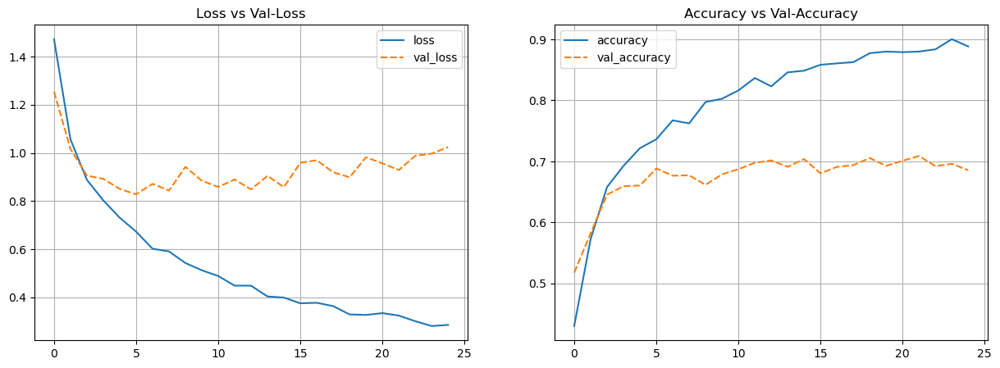

In [18]:
# Plot training results
history_df = pd.DataFrame(history_tl.history)

# plotting loss vs val_loss
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

# plotting accuracy vs val_accuracy
plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

# menampilkan plot
plt.show()

Berdasarkan kedua grafik tersebut, dapat disimpulkan bahwa model mengalami overfitting. Model terlalu kompleks dan terlalu fokus pada data pelatihan sehingga tidak mampu menggeneralisasi dengan baik pada data baru. Grafik menunjukkan bahwa akurasi pada data pelatihan terus meningkat, namun akurasi pada data validasi cenderung stagnan atau bahkan menurun setelah beberapa epoch.

### Model Transfer Learning Classification Report Evaluation

In [27]:
# predict test set
y_pred_prob_tl = model_tl.predict(test_set_tl)

# mengklasifikasikan class berdasarkan nilai proba terbesar
y_pred_class_tl = np.argmax(y_pred_prob_tl, axis=-1)

# menampilkan classification report
print(classification_report(test_set_tl.classes, y_pred_class_tl, target_names=np.array(list(train_set_tl.class_indices.keys()))))

19/19 ━━━━━━━━━━━━━━━━━━━━ 358s 17s/step
              precision    recall  f1-score   support

      Ahegao       0.94      0.94      0.94       200
       Happy       0.75      0.69      0.72       200
     Neutral       0.56      0.59      0.57       200
         Sad       0.52      0.46      0.49       200
    Surprise       0.83      0.76      0.79       200
       angry       0.64      0.77      0.70       200

    accuracy                           0.70      1200
   macro avg       0.70      0.70      0.70      1200
weighted avg       0.70      0.70      0.70      1200



Analisis Per Kelas
- Model menunjukkan kinerja yang sangat baik dalam mengklasifikasikan ekspresi "Ahegao", dengan nilai precision, recall, dan F1-score yang hampir mencapai 1. Hal ini menunjukkan akurasi yang tinggi dalam identifikasi ekspresi tersebut.
- Model memiliki performa yang cukup baik dalam mengklasifikasikan ekspresi "Happy", meskipun nilai precision sedikit lebih rendah dibandingkan dengan recall. Ini menandakan bahwa model mungkin cenderung salah mengklasifikasikan beberapa ekspresi lain sebagai "Happy".
- Model menghadapi kesulitan dalam membedakan ekspresi "Neutral" dan "Sad". Nilai precision, recall, dan F1-score untuk kedua kelas ini cenderung rendah jika dibandingkan dengan kelas lainnya, yang menunjukkan bahwa model sering salah mengklasifikasikan ekspresi "Neutral" sebagai "Sad" dan sebaliknya.
- Model menunjukkan kinerja yang cukup baik dalam mengklasifikasikan ekspresi "Surprise" dan "Angry", meskipun precision untuk kelas "Angry" sedikit lebih rendah dibandingkan recall.

### Model Transfer Learning Confusion Matrix Evaluation

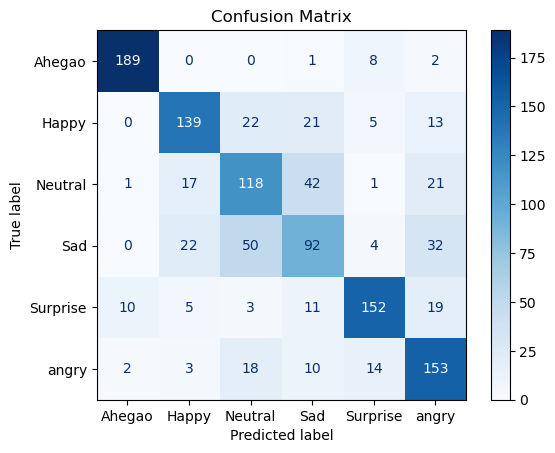

In [28]:
# mendapatkan label asli dari dataset test
y_true_labels = test_set_tl.classes

# membuat confusion matrix
cm = confusion_matrix(y_true_labels, y_pred_class_tl)

# menampilkan confusion matrix dalam bentuk plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set_tl.class_indices.keys())
disp.plot(cmap=plt.cm.Blues) 

# menampilkan plot
plt.title('Confusion Matrix')
plt.show()

Dari hasil output diatas,diketahui : 

- **Ahegao:**
    
    Prediksi Benar: 189 dari 200 sampel. Model sangat baik dalam mengklasifikasikan ekspresi "Ahegao". Hampir semua sampel dengan label "Ahegao" berhasil diklasifikasikan dengan benar.
- **Happy:**

    Prediksi Benar: 139 dari 200 sampel.Model cukup baik dalam mengklasifikasikan ekspresi "Happy". Namun, ada beberapa kasus di mana ekspresi "Happy" salah diklasifikasikan sebagai "Neutral" atau "Sad".
- **Neutral:**

    Prediksi Benar: 118 dari 200 sampel.Model mengalami kesulitan dalam mengklasifikasikan ekspresi "Neutral". Seringkali, ekspresi "Neutral" salah diklasifikasikan sebagai "Sad".
- **Sad:**

    Prediksi Benar: 92 dari 200 sampel.Model juga mengalami kesulitan dalam mengklasifikasikan ekspresi "Sad". Seringkali, ekspresi "Sad" salah diklasifikasikan sebagai "Neutral".
- **Surprise:**

    Prediksi Benar: 152 dari 200 sampel. Model cukup baik dalam mengklasifikasikan ekspresi "Surprise".
- **Angry:**

    Prediksi Benar: 153 dari 200 sampel. Model cukup baik dalam mengklasifikasikan ekspresi "Angry".

**Conclusion**

Model menunjukkan kinerja terbaik dalam mengklasifikasikan ekspresi "Ahegao" dan mengalami kesulitan dalam membedakan antara ekspresi "Neutral" dan "Sad". Ini mungkin karena kesamaan visual antara kedua ekspresi tersebut.

Potensi: Secara keseluruhan, model sudah cukup baik, namun masih ada ruang untuk peningkatan, terutama pada kelas "Neutral" dan "Sad".


> Dari beberapa pemodelan yang telah dilakukan pada dataset ini, model berbasis transfer learning menunjukkan kinerja yang paling unggul dibandingkan dengan model lainnya. Oleh karena itu, pada proyek ini diputuskan untuk menggunakan metode transfer learning sebagai pendekatan utama dalam pemodelan yang dilakukan, mengingat kemampuannya yang efektif dalam meningkatkan akurasi dan performa secara keseluruhan.

# Model Saving

In [29]:
model_tl.save('best_model.h5')